In [1]:
#%% Imports
# -*- coding: utf-8 -*-
"""
Created on Mon Nov 21 08:27:03 2022

@author: Kongs
"""

from glob import glob

import earthpy as et
import earthpy.spatial as es
import earthpy.plot as ep
import rasterio as rasterio
import matplotlib.pyplot as plt
import numpy as np
from matplotlib.colors import ListedColormap
from rasterio import plot
from rasterio.plot import show
from rasterio.mask import mask
import geopandas as gpd
import plotly.graph_objects as go
import os
import fiona
from IPython.display import Image
from IPython.display import HTML, display

## Sentinel-2 Bands
The Sentinel-2 bands are displayed in the table below.
B8A is the "last" of the bands when stacking the numpy array. 
As the various resolutions have been resampled to 10 meters via ESA's SNAP toolbox, all combinations of bands can be made

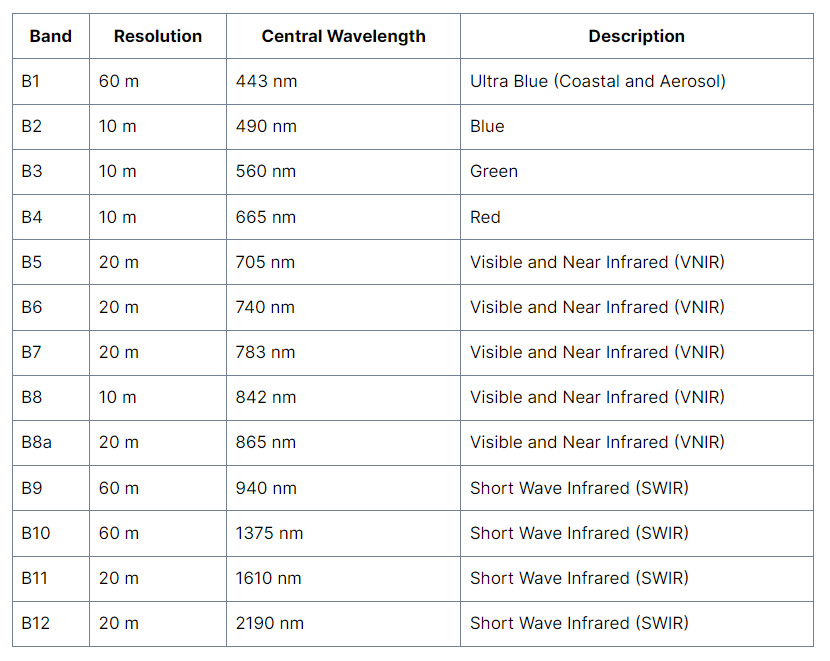

In [3]:
Image(filename = "ext_img/bands_list.PNG", width=700, height=200)

In [4]:
# Load images that has already been sliced and diced in SNAP toolbox

# path = '../../Optical/Vegetation_ML/images_tiff/resampled/geotiff/medium/'
path = '../../Optical/Vegetation_ML/images_tiff/resampled/geotiff/larger/'

s2_bands = glob(path+'*B*.tif')
s2_bands.sort()

print('Showing all loaded bands, the order they are loaded in and array identifier:')
for ix, ls in enumerate(s2_bands):
    print(ls + f', Array ID [{ix}]')

# Load all bands and stack them in a np array
img = []

for i in s2_bands:
    #print(i)
    with rasterio.open(i, 'r') as f:
        img.append(f.read(1))
        
arr_st = np.stack(img)

Showing all loaded bands, the order they are loaded in and array identifier:
../../Optical/Vegetation_ML/images_tiff/resampled/geotiff/larger\subset_resampled_B01.tif, Array ID [0]
../../Optical/Vegetation_ML/images_tiff/resampled/geotiff/larger\subset_resampled_B02.tif, Array ID [1]
../../Optical/Vegetation_ML/images_tiff/resampled/geotiff/larger\subset_resampled_B03.tif, Array ID [2]
../../Optical/Vegetation_ML/images_tiff/resampled/geotiff/larger\subset_resampled_B04.tif, Array ID [3]
../../Optical/Vegetation_ML/images_tiff/resampled/geotiff/larger\subset_resampled_B05.tif, Array ID [4]
../../Optical/Vegetation_ML/images_tiff/resampled/geotiff/larger\subset_resampled_B06.tif, Array ID [5]
../../Optical/Vegetation_ML/images_tiff/resampled/geotiff/larger\subset_resampled_B07.tif, Array ID [6]
../../Optical/Vegetation_ML/images_tiff/resampled/geotiff/larger\subset_resampled_B08.tif, Array ID [7]
../../Optical/Vegetation_ML/images_tiff/resampled/geotiff/larger\subset_resampled_B09.tif, 

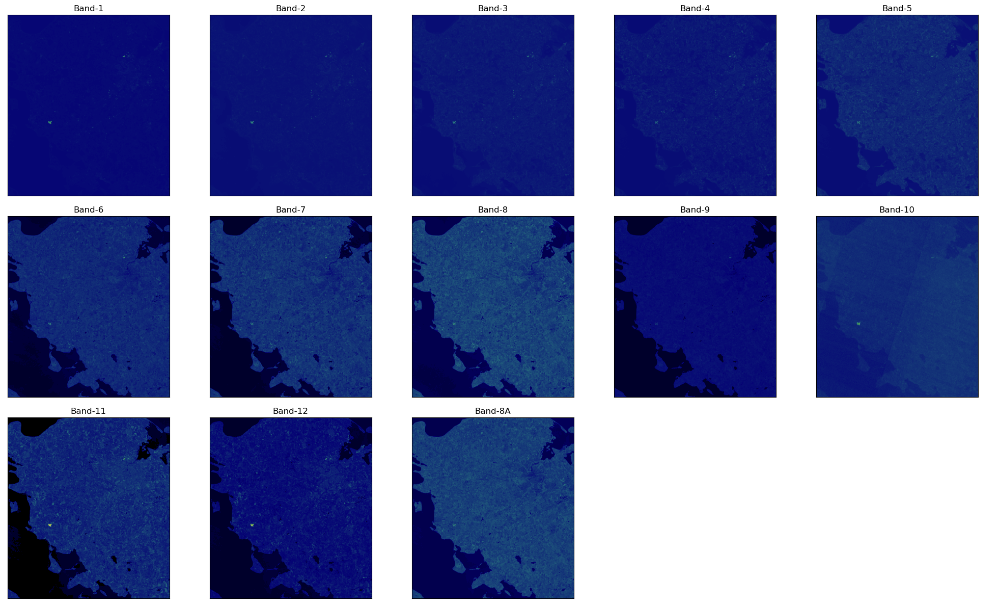

<Figure size 640x480 with 0 Axes>

In [8]:
# Plot all bands side by side.
titles = ('Band-1', 'Band-2', 'Band-3', 'Band-4', 'Band-5', 'Band-6', 'Band-7', 'Band-8', 'Band-9',  'Band-10', 'Band-11' ,'Band-12', 'Band-8A')

ep.plot_bands(arr_st, title=titles,
              cmap = 'gist_earth',
              figsize = (20, 12), 
              cols = 5, 
              cbar = False)
#plt.show()
plt.tight_layout()

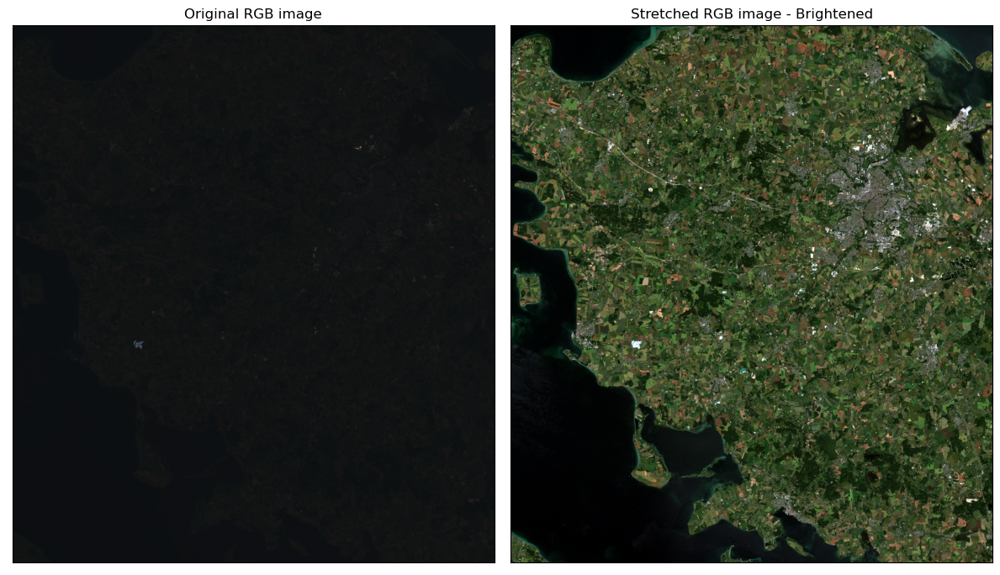

In [9]:
# Plot original RGB composite picture

fig, (ax1, ax2) = plt.subplots(1,2, figsize=(12, 12))

# RGB Composite Image
ax1 = ep.plot_rgb(arr_st, 
            ax=ax1,
            rgb=(3,2,1), 
            figsize=(10, 16),
            title='Original RGB image')

# RGB Composite Image with Strech
ax2 = ep.plot_rgb(arr_st,
            ax=ax2,
            rgb=(3, 2, 1),
            stretch=True, # Extends the values to 0-255 values to increase contrast in image
            str_clip=0.2, # Specify cliping of the data tails
            figsize=(10, 16),
            title='Stretched RGB image - Brightened')


plt.tight_layout() # Auto adjust to fill out subplots

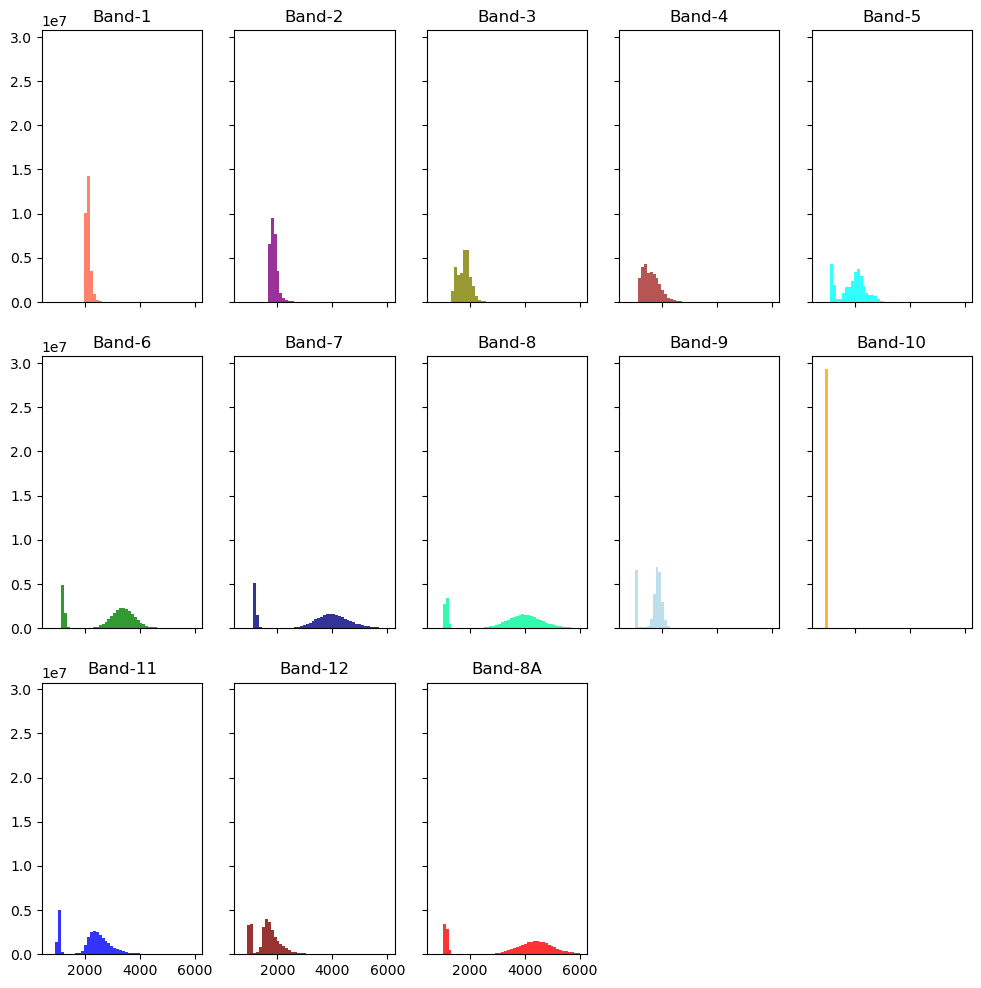

In [16]:
# Plotting histograms
colors = ['tomato', 'purple', 'olive', 'brown', 'cyan', 'green',
          'navy', 'MediumSpringGreen', 'lightblue', 'orange', 'blue', 'maroon', 'red']


ep.hist(arr_st,
        title=titles,
        colors = colors,
        cols=5, 
        alpha=0.8, 
        bins = 50,
        hist_range=(700,6000),
        figsize = (12, 12))

plt.show()

## Normalized Difference Vegetation Index (NDVI)
Healthy green plants are known to absorb radiation which they use as energy in the process of photosynthesis. This is known as the photosynthetically active radation (PAR) region. The plants re-emit most of the solar radiation away in the near-infrared (NIR) spectral region. Therefore healthy green plants will appear darker in PAR, but brighter in NIR. 
This is due to the chlorophyll in the plants which strongly absorbs visible light (400-700 nm) for use in photosynthesis, whilst the cell structure of the leaves reflects energy away in NIR (700-1100 nm). This is why NDVI is generally used as measurement of crop health as lower chlorophyll means less VIS(red) uptake and less NIR reflected, hence the yellow look in less-healthy plants.

The NDVI is calculated as the transformation of the spectral ratio of NIR/VIS(red) and has no functional relationship with a spectral difference (NIR-VIS(red)). 

It is calculated as: 

$$
NDVI = \frac{(NIR-VIS(RED))}{(NIR+VIS(RED))}
$$

For Sentinel-2 that is:
$$
NDVI = \frac{(B8-B4)}{(B8+B4)}
$$

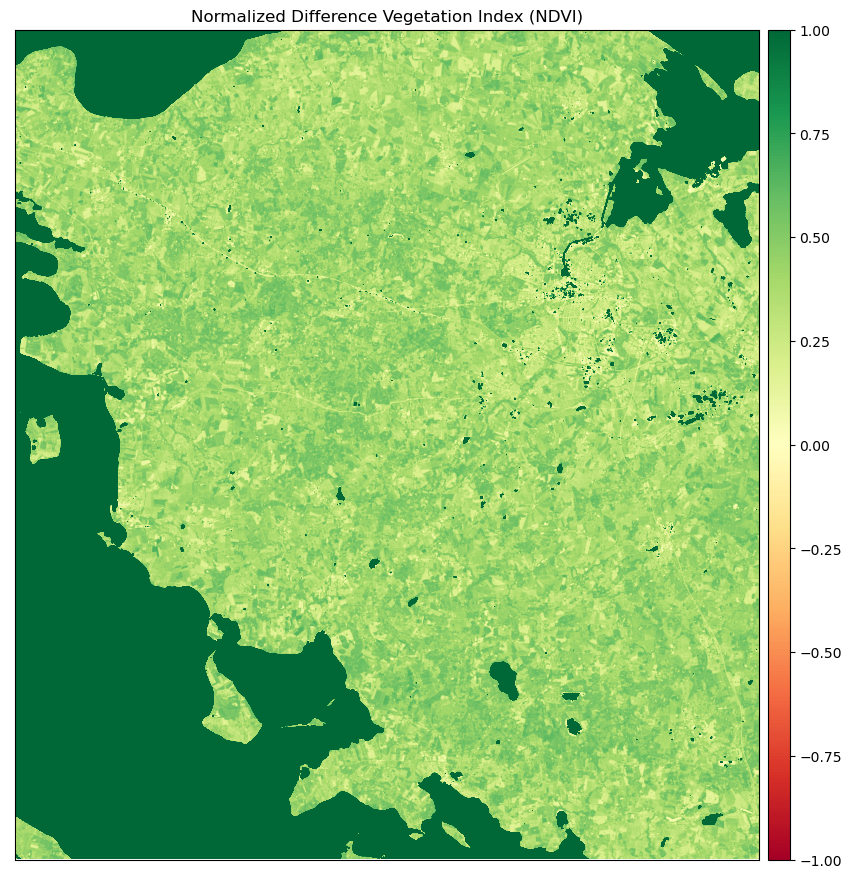

In [17]:
# NDVI Normalised Difference Vegetation Index with continous legend

ndvi = es.normalized_diff(arr_st[7], arr_st[3])
figndvi=ep.plot_bands(ndvi, cmap="RdYlGn", title=['Normalized Difference Vegetation Index (NDVI)'], cols=1, vmin=-1, vmax=1, figsize=(10, 14))
plt.show()

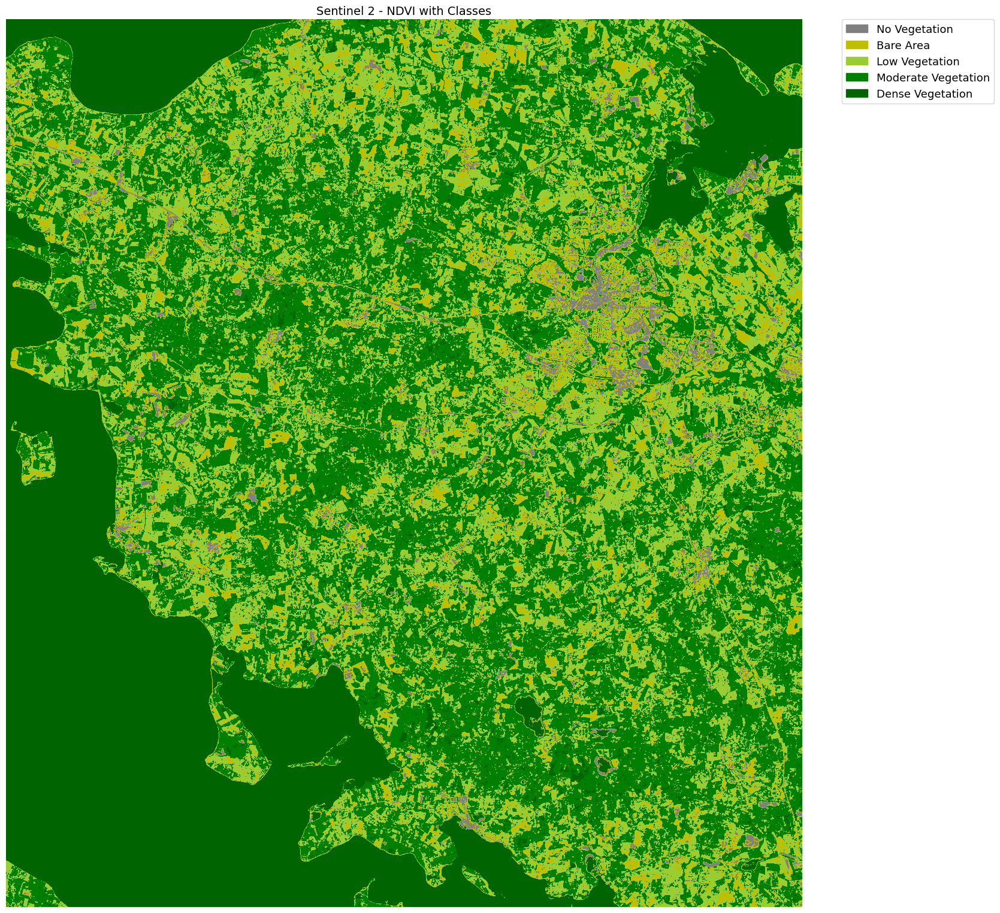

In [18]:
# NDVI With classes colored MAYBE DONT ADD THIS?

ndvi = es.normalized_diff(arr_st[7], arr_st[3])
ndvi_class_bins = [-np.inf, 0, 0.15, 0.25, 0.4, 0.6, np.inf]
ndvi_sent_class = np.digitize(ndvi, ndvi_class_bins)
ndvi_sent_class = np.ma.masked_where(
    np.ma.getmask(ndvi), ndvi_sent_class
)
np.unique(ndvi_sent_class)

# Define color map
nbr_colors = ["gray", "y", "yellowgreen", "g", "darkgreen"]
nbr_cmap = ListedColormap(nbr_colors)

# Define class names
ndvi_cat_names = [
    "No Vegetation",
    "Bare Area",
    "Low Vegetation",
    "Moderate Vegetation",
    "Dense Vegetation",
]

# Get list of classes
classes = np.unique(ndvi_sent_class)
classes = classes.tolist()
# The mask returns a value of none in the classes. remove that
classes = classes[0:5]

# Plot your data
fig, ax = plt.subplots(figsize=(16, 16))
im = ax.imshow(ndvi_sent_class, cmap=nbr_cmap)

ep.draw_legend(im_ax=im, classes=classes, titles=ndvi_cat_names)
ax.set_title(
    "Sentinel 2 - NDVI with Classes",
    fontsize=14,
)
ax.set_axis_off()

# Auto adjust subplot to fit figure size
plt.tight_layout()

The above image shows the NDVI but visualized as classes instead. Particular urban areas are easier to identify as grey.

* Grey - No vegetation
* Brown/Yellow - Bare area
* Light green - Low vegetation
* Green - Moderate vegetation
* Dark Green - Dense vegetation

The grey areas are generally located near gravel pits, which are often found around the small man-made lakes, being the product of water filled gravel pits. Some of the gravel pits are visible as dark green in the figure above.

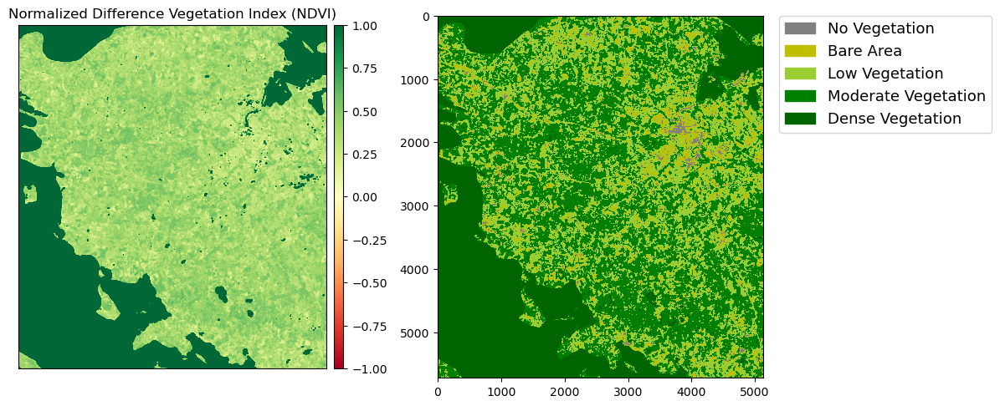

In [19]:
## Plotting the two side by side
fig, (ax1, ax2) = plt.subplots(1,2, figsize=(12, 12))

ax1 = ep.plot_bands(ndvi, cmap="RdYlGn", title=['Normalized Difference Vegetation Index (NDVI)'], cols=1, vmin=-1, vmax=1, ax=ax1)
ax2 = ax2.imshow(ndvi_sent_class, cmap=nbr_cmap)
ep.draw_legend(im_ax=ax2, classes=classes, titles=ndvi_cat_names)

# Auto adjust subplot to fit figure size

plt.tight_layout()



## Quick look at the weather
If we take a quick look at the forecast from the Danish meteorological institute on the day the Sentinel-2 images were taken, which are shown below, we can see that it was a very dry and relatively summer for Denmark. The drought index (Tørkeindeks) is very high, precipitation (Nedbør) has been lacking for a week and the temperature for the region (Faaborg-Midtfyn county) has been relatively warm.
The soil in this region is fairly rich on clay and generally stays wet, which generally means the vegetation has a high water content and stands better against droughts. But before jumping to conclusions on this imagery, lets take a look at some more satellite based infomation.

In [20]:
#Image(filename = "ext_img/drought.PNG", width=700, height=200)


display(HTML("<table><tr><td><img src='ext_img/drought.png'. width = 700></td><td><img src='ext_img/droughtindex.PNG'></td></tr></table>"))
display(HTML("<table><tr><td><img src='ext_img/precipitation.png'></td><td><img src='ext_img/temperatures.PNG'></td></tr></table>"))

,


,


## Soil Adjust Vegetation index (SAVI)
SAVI was establish as a means to create better NDVI products since NDVI tends to be unstable as it is influenced by soil moisture, soil color and saturation effects from high density vegetation. SAVI is a vegetation index that takes into account the differential red and near infrared extinction through the vegetation canopy. This index is a transformation technique that minimizes soil brightness influence from spectral vegetation indicies that involve red and near-infrared wavelengths. 

It is calculated as:

$$
SAVI = \frac{(1-L)(NIR-VIS(red))}{(NIR+VIS(red)+L)}
$$

For Sentinel-2 that is:
$$
SAVI = \frac{(1-L)(B8-B4))}{(B8+B4)+L)}
$$

The variable L is a canopy background adjustment factor, where a value of 0.5 in reflectance was found to minimize soil brightness variations and eliminates the need to calibrate for different soils. This transformation was found to nearly eliminate soil-induced variations in vegetation indices. 

Generall L values used:
* L = 0.0 Very high vegetation cover area (Thus equal to NDVI)
* L = 0.5 Moderate vegetation cover area
* L = 1.0 No green vegetation cover area (Arid)

*Citation: [Huete, A.R (August 1988). "A soil-adjusted vegetation index (SAVI)". Remote Sensing of Environment. 25 (3): 295–309. doi:10.1016/0034-4257(88)90106-X](https://www.sciencedirect.com/science/article/abs/pii/003442578890106X?via%3Dihub)*

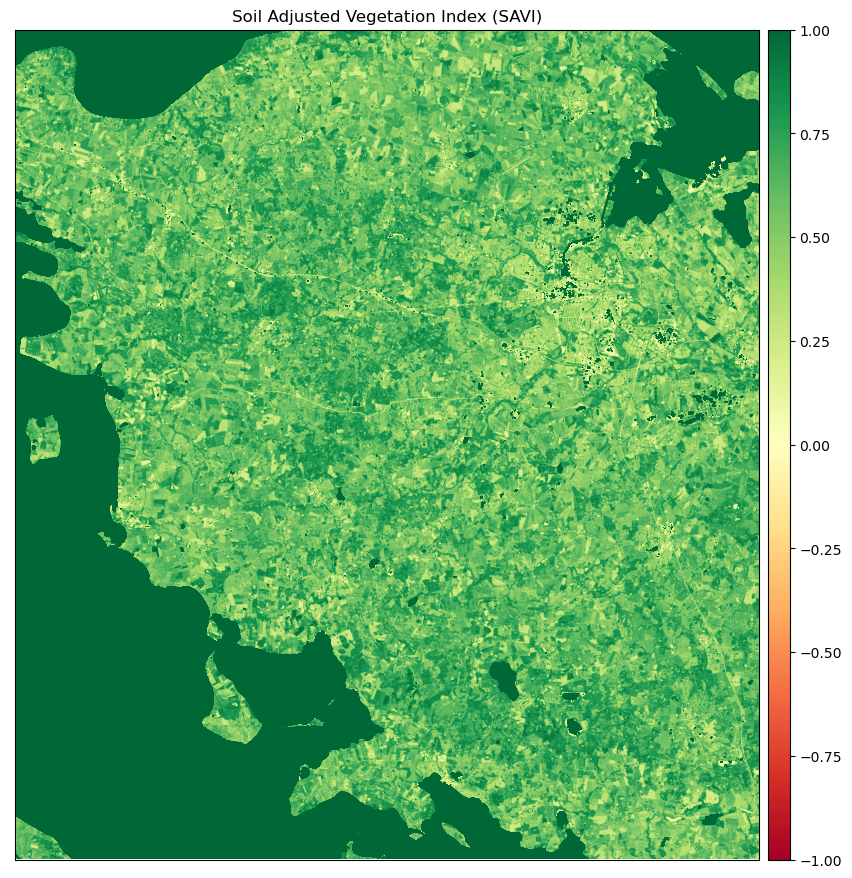

In [21]:
# Soil adjusted vegetation index (SAVI)

L = 0.5

savi = ((arr_st[7] - arr_st[3]) / (arr_st[7] + arr_st[3] + L)) * (1 + L)

figsavi = ep.plot_bands(savi, cmap="RdYlGn", title='Soil Adjusted Vegetation Index (SAVI)', cols=1, vmin=-1, vmax=1, figsize=(10, 14))
plt.show()

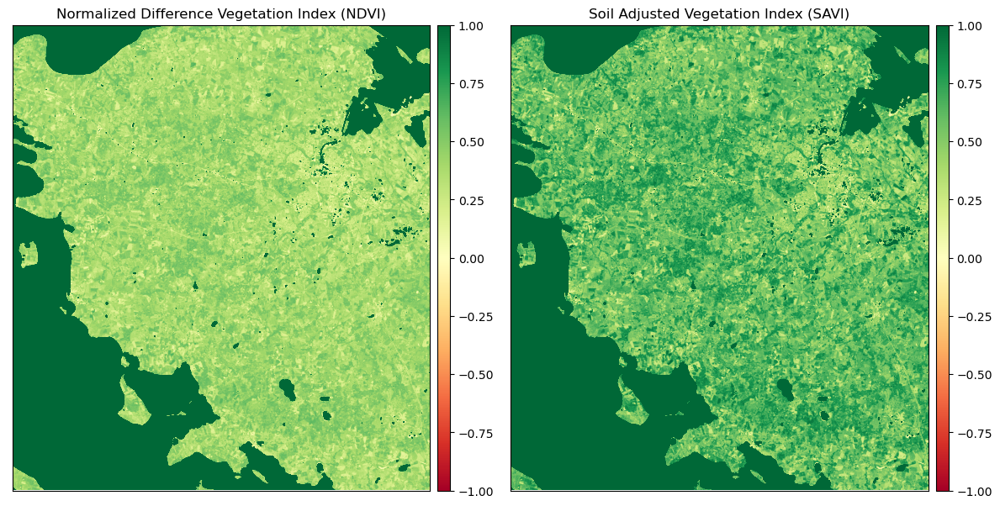

In [22]:
## Comparison of SAVI and NDVI

fig, (ax1, ax2) = plt.subplots(1,2, figsize=(12, 12))

# NDVI
ax1 = ep.plot_bands(ndvi, cmap="RdYlGn", title='Normalized Difference Vegetation Index (NDVI)', cols=1, vmin=-1, vmax=1, ax=ax1)

# SAVI
ax2 = ep.plot_bands(savi, cmap="RdYlGn", title='Soil Adjusted Vegetation Index (SAVI)',         cols=1, vmin=-1, vmax=1, ax=ax2)

plt.tight_layout() # Auto adjust to fill out subplots

### NDVI and SDVI comparison
As seen in the image above, the soil adjusted vegetation index takes into account soil brightness and attempts to minimize its effect. It is clear in this comparison that the SAVI subplot now has values closer to 1. 

## Visible Atmospherically Resistant Index (VARI)

### Should this be included??

VARI is designed to focus on vegetation in the visible portion of the spectrum whilst mitigating illumination differences and atmospheric effects. It utilizes all three color band (B2, B3, B4)


It is calculated as:

$$
VARI = \frac{Green-Red}{Green+Red-Blue}
$$

For Sentinel-2 that is:
$$
VARI = \frac{(B3-B4)}{(B3+B4-B2)}
$$

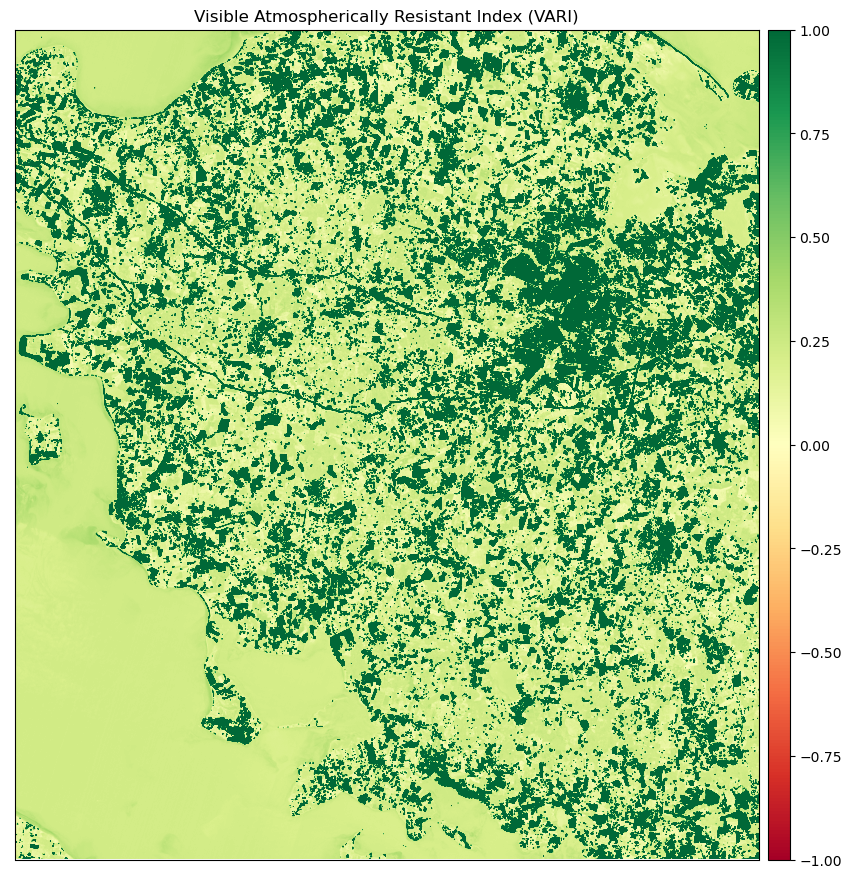

In [23]:
# VARI

vari = (arr_st[2] - arr_st[3])/ (arr_st[2] + arr_st[3] - arr_st[1])

ep.plot_bands(vari, cmap="RdYlGn", title='Visible Atmospherically Resistant Index (VARI)', cols=1, vmin=-1, vmax=1, figsize=(10, 14))

plt.show()

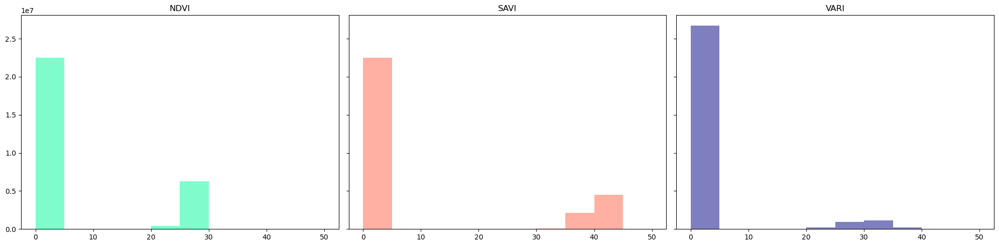

In [24]:
# Distribution of NDVI SAVI adn VARI pixel values SHOULD THIS BE HERE?

ep.hist(np.stack([ndvi, savi, vari]), 
        alpha=0.5,
        hist_range=(0,50),
        cols=3, 
        bins = 10, 
        figsize=(20, 5),
        title = ['NDVI', 'SAVI', 'VARI'],
        colors = ['mediumspringgreen', 'tomato', 'navy'])

plt.tight_layout() 

## Water metrics
Surface water and water content is another metric that can be extracted from satellite imagery and provides useful information in understanding crop health and the impact of droughts. It can also serve as information in understanding the risks of wildfires.

### Modified Normalized Difference Water Index (MNDWI)

# This seems useless

The Modified Normalized Difference Water Index (MNDWI) is a modified metric from the NDWI, which are generally used to detect water bodies. As NDWI cannot suppress the signal noise coming from the land cover features of built-up areas efficiently. It was established *(See citation below)* that water bodies have a stronger absorbability in the SWIR band than that in the NIR band, and the built-up class has greater radiation in the SWIR band than that in the NIR band. Therefore being able to extract water bodies with greater accuracy than NDWI. Based on this finding, the MNDWI is used which is defined as:

$$
MNDWI = \frac{Green-SWIR}{Green+SWIR}
$$

For Sentinel-2 that is:
$$
MNDWI = \frac{(B3-B11)}{(B3+B11)}
$$

*Citation: [Yun Du (April 2016). "Water Bodies’ Mapping from Sentinel-2 Imagery with Modified Normalized Difference Water Index at 10-m Spatial Resolution Produced by Sharpening the SWIR Band, https://doi.org/10.3390/rs8040354](https://doi.org/10.3390/rs8040354)*


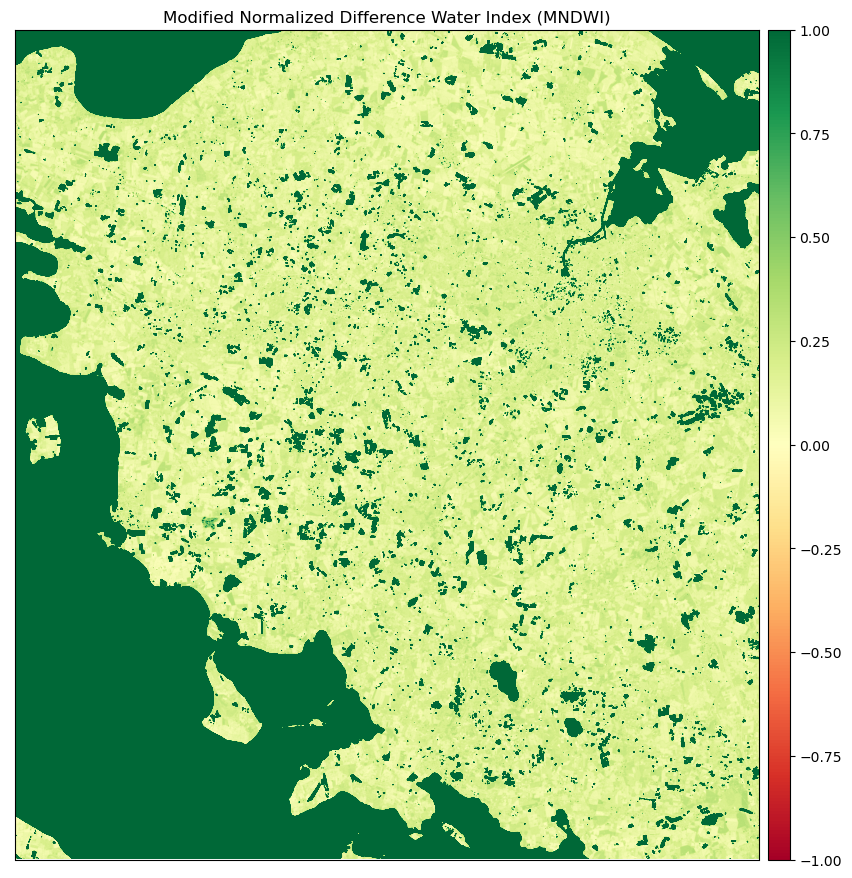

In [54]:
# Modified Normalized Difference Water Index

mndwi = es.normalized_diff(arr_st[10], arr_st[2]) 

ep.plot_bands(mndwi, cmap="RdYlGn", title='Modified Normalized Difference Water Index (MNDWI)', cols=1, vmin=-1, vmax=1, figsize=(10, 14))

plt.show()

### Normalized Difference Moisture Index (NDMI)

NDMI is sensitive to the moisture levels in the vegetation. As touched upon earlier this is useful when monitoring droughts and potential for wild fires. This metric uses the B8 NIR  and the B12 SWIR band to create a ratio with the intend of mitigating illumination and atmospheric effects.

$$
NDMI = \frac{NIR-SWIR}{NIR+SWIR}
$$

For Sentinel-2 that is:
$$
NDMI = \frac{(B8-B12)}{(B8+B12)}
$$

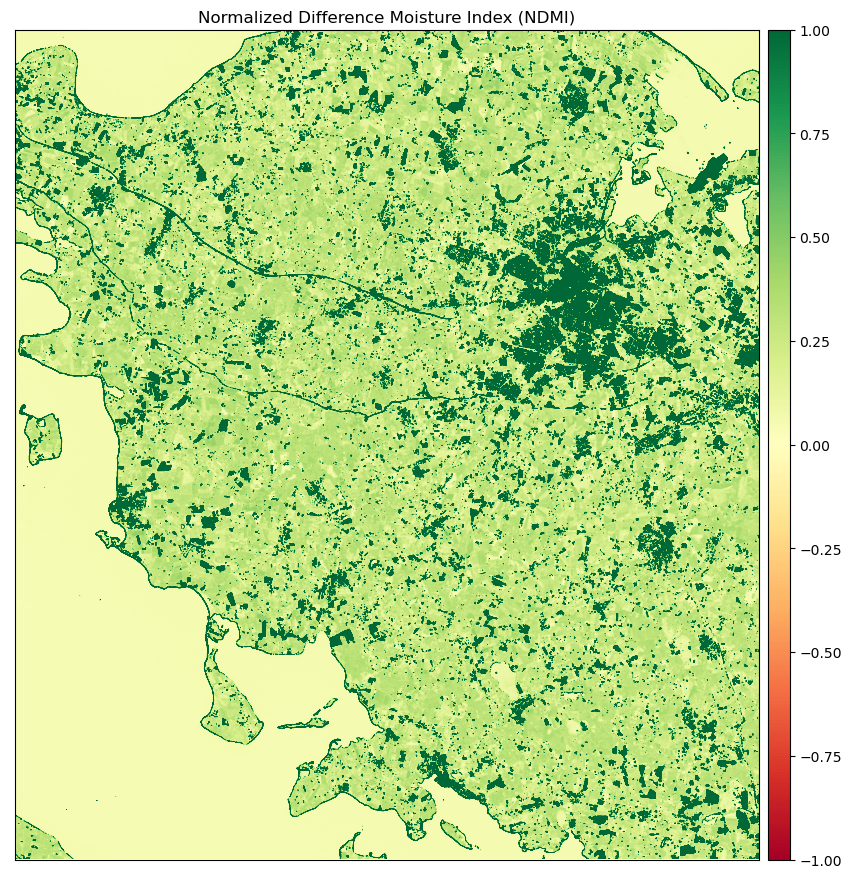

In [25]:
# NDMI normalized difference moisture index.

ndmi = es.normalized_diff(arr_st[7], arr_st[10])

ep.plot_bands(ndmi, cmap="RdYlGn", title='Normalized Difference Moisture Index (NDMI)', cols=1, vmin=-1, vmax=1, figsize=(10, 14))

plt.show()

In [ ]:
## Comparison of MNDWI and NDMI

fig, (ax1, ax2) = plt.subplots(1,2, figsize=(12, 12))

# NDVI
ax1 = ep.plot_bands(mndwi, cmap="RdYlGn", title='Modified Normalized Difference Water Index (MNDWI)', cols=1, vmin=-1, vmax=1, figsize=(10, 14), ax=ax1)

# SAVI
ax2 = ep.plot_bands(ndmi, cmap="RdYlGn", title='Normalized Difference Moisture Index (NDMI)', cols=1, vmin=-1, vmax=1, figsize=(10, 14), ax=ax2)

plt.tight_layout() # Auto adjust to fill out subplots

## Geology indices

In [ ]:
# Geology indices

cmr = np.divide(arr_st[10], arr_st[11])

ep.plot_bands(cmr, cmap="RdYlGn", title='Clay Ratio', cols=1, vmin=-1, vmax=1, figsize=(10, 14))

plt.show()

In [ ]:
# Ferrous minerals

fmr = np.divide(arr_st[10], arr_st[7])

ep.plot_bands(fmr, cmap="RdYlGn", title='Ferrous Minerals Ratio', cols=1, vmin=-1, vmax=1, figsize=(10, 14))

plt.show()

### Machine learning part
Under construction

In [ ]:
x = np.moveaxis(arr_st, 0, -1)
x.shape

In [ ]:
x.reshape(-1, 12).shape, 1526*1976

In [ ]:
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA

X_data = x.reshape(-1, 12)

scaler = StandardScaler().fit(X_data)

X_scaled = scaler.transform(X_data)

X_scaled.shape

## PCA

In [ ]:
pca = PCA(n_components = 4)

pca.fit(X_scaled)

data = pca.transform(X_scaled)

In [ ]:
data.shape

In [ ]:
pca.explained_variance_ratio_

In [ ]:
np.sum(pca.explained_variance_ratio_)

In [ ]:
ep.plot_bands(np.moveaxis(data.reshape((1526, 1976, data.shape[1])), -1, 0),
              cmap = 'gist_earth',
              cols = 4,
              title = [f'PC-{i}' for i in range(1,5)])

plt.show()

## Kmeans

In [ ]:
from sklearn.cluster import KMeans

kmeans = KMeans(n_clusters = 6, random_state = 11)

kmeans.fit(data)

In [ ]:
labels = kmeans.predict(data)

In [ ]:
np.unique(labels)

In [ ]:
ep.plot_bands(labels.reshape(1526, 1976), cmap=ListedColormap(['darkgreen', 'green', 'black', '#CA6F1E', 'navy', 'forestgreen']))
plt.show()

In [ ]:
import plotly.express as px

fig = px.imshow(labels.reshape(1526, 1976), 
          color_continuous_scale = ['darkgreen', 'green', 'black', '#CA6F1E', 'navy', 'forestgreen'])

fig.update_xaxes(showticklabels=False)

fig.update_yaxes(showticklabels=False)

fig.update_layout(
    autosize=False,
    width=8000,
    height=8000,
    margin=dict(
        l=50,
        r=50,
        b=100,
        t=100,
        pad=4
    ),
    # paper_bgcolor="LightSteelBlue",
)